## Structure of the lecture

1. Introduction
2. Dealing with audio data
3. Basics of ASR
4. ASR for a small language like Luxembourgish
5. Meta's wav2vec 2.0
6. OpenAi's Whisper
7. Conclusion

## Introdcution: History of Automatic Speech Recognition

- Euphoric phase in the 1950s at Bell Labs, IBM
- Hidden Markov Models (HMM)
    - predict the probability of a sound or a word
    - not based on acoustic features alone
- 1980s: Neural Networks
    - Loads of annotated training material needed (based on word or even phonetic segment)
    - Only for one specific language
    - Highly task and speaker dependent
- 2010s: Deep Neural Networks / Transformer Models


## Intro: Applications of ASR

- Real-time transcription
    - dictation
    - subtitling of videos
- Transcription of audio recordings
    - Speeches, debates at the parliament, podcasts, videos etc.
- Audio commands
    - Siri, Alexa
- Keyword detection (i.e. for call centers)
- Speaker verification / identification
- Phonetic segmentation of audio recordings (‘Alignment’) for linguistic studies
- Emotion detection
- AI interactions
    - chatbots
    - Q&A

## Dealing with audio data
- Recommended overview: @huiSpeechRecognitionPhonetics2022

- Acoustic representation of speech: continuous signal with amplitude modulation in time
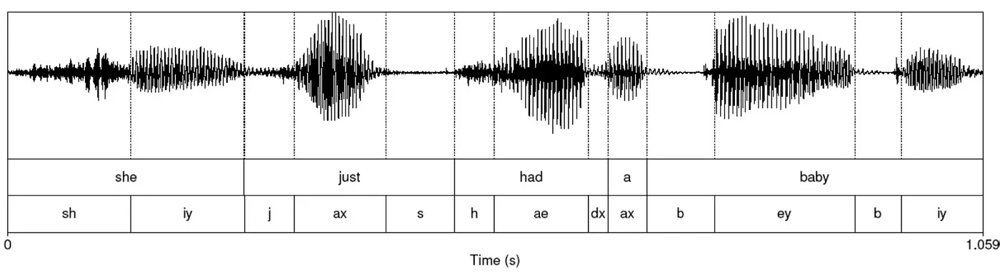
- Incredibly variable, due to ...
    - accent
    - speaking style
    - speaker-dependent characteristics
    - recording conditions

- Basic acoustic representation for speech: Spectrogram
    - x: time
    - y: frequency
    - color: intensity

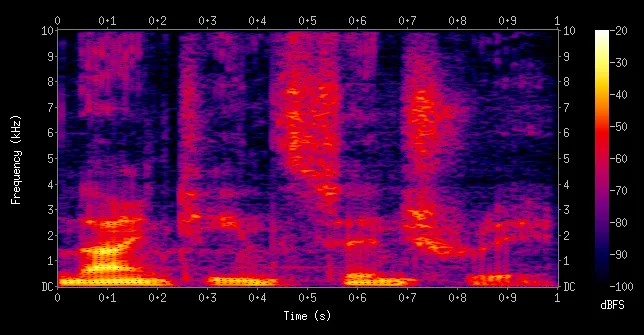

## Dealing with audio data
- Processing unit for ASR:
    - frames with 25ms width
    - 10ms overlap
    - capture all relevant linguistic information
    - feature extraction: Mel-frequency cepstral coefficients (MFCC) or Mel spectrogram
    - 39 features per frame, stored as vector
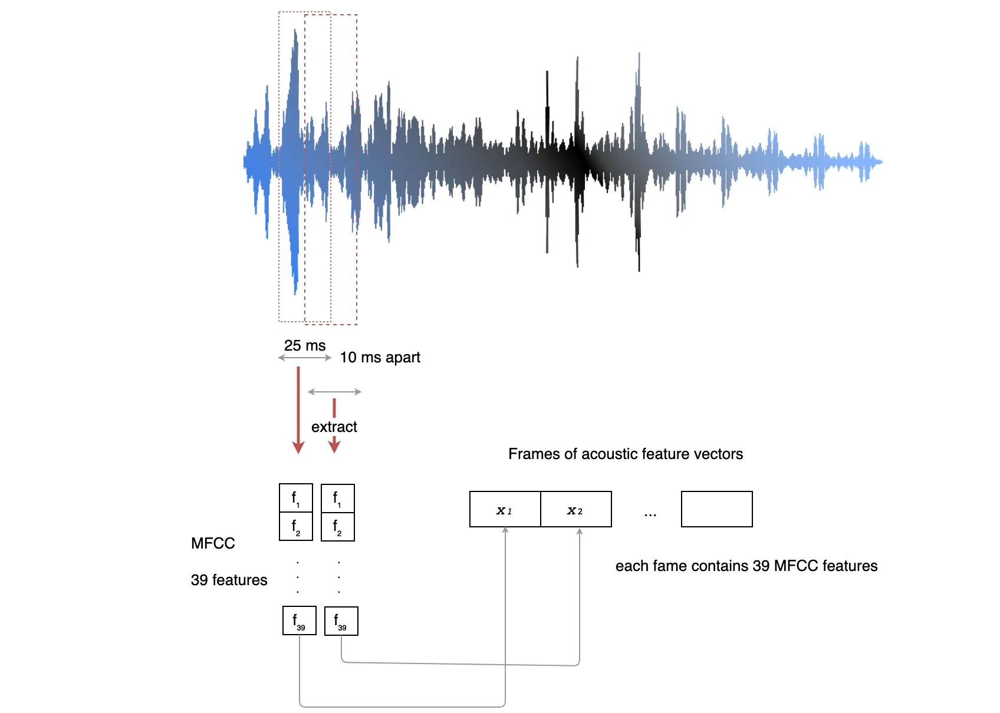

## Basics of Automatic Speech Recognition
- Main task of ASR
    - Use a statistical model to recognise the correct text from a sequence of feature vectors

- Design of a traditional ASR system
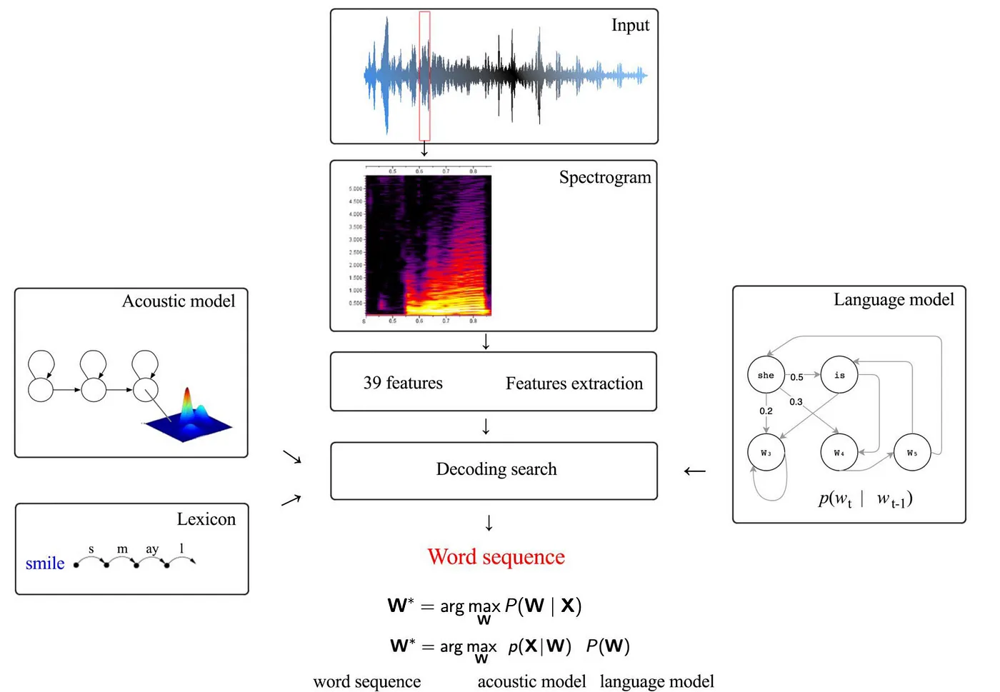{width=80%}
- Necessary ingredients for the model
    - acoustic model based on fine-grained annotated speech
    - pronunciation lexicon
    - language model

## Basics of Automatic Speech Recognition
- The rise of Deep Learning (DL)
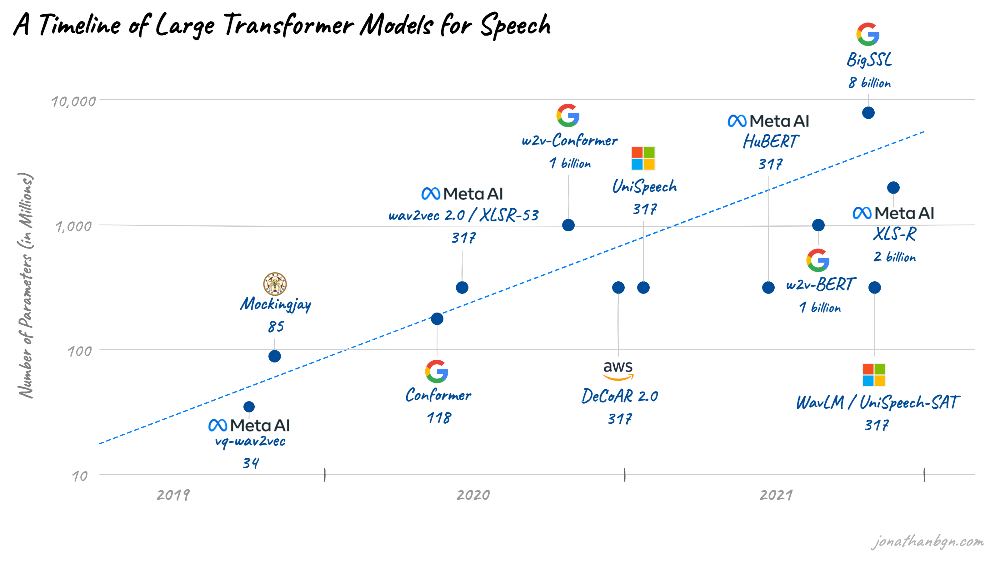

- Transformer models
    - accounting for context in a broad and flexible way
    - abstract and generalized representations of the speech signal that capture its relevant features, such as phonetic, spectral, or contextual information
    - generated in a Neural Network
- End-to-end models
    - no intermediate steps necessary, e.g. phoneme detection, phoneme2grapheme conversion, pronunciation dictionary etc.

## ASR for low-resource languages

- Challenges of Luxembourgish 
    - paucity of training data
    - lots of spelling variation
    - costly to compile training data

## Compilation of training data

- Algorithms will 'learn' from example
    - pairs of text transcription and matching audio
    - compilation of audio samples of 2 to 20 sec length
    - multiple speakers
    - various speaking genres (debates in the parliament, media recordings, podcasts, interviews, elicited sentences etc.)
    - meticulous checks of the data
    - atm 40,000 samples / 70 hours of training data
- Training data shall contain as many sound and word combinations as possible

| Transcription | Audio |
| ------ | ----- |
| Luc hat eng Frëndin, déi lieft a Corse.    | <audio src="https://luxappsdata.uni.lu/schnessen/media/recording_recordings/2018-08-06/pg_191_3314_p1rzb.wav" controls> </audio> |
| hei iwwer déi Datumen ze schwätzen. Ech wëll just soen, datt ech e Rapport vum 16.    | <audio src="Chamber_2020_10_29_1917.wav" controls> </audio> |
| Entschëllegt, et ass déi, vun där ech och schwätzen. A mir kënnen net äh am Kaffismarc liesen äh | <audio src="Chamber_2020_10_29_1913.wav" controls> </audio> |
| Wat mer matgedeelt kréien. Mir hunn dat Resultat eréischt matgedeelt kritt, nodeem et | <audio src="Chamber_2020_10_29_1914.wav" controls> </audio> |


## Meta’s Wav2vec 2.0 (@baevskiWav2vecFrameworkSelfSupervised2020)

- Self-supervised learning of unlabeled speech
- Trained on 0.5 million hours of speech from 128 languages
- Pre-training with up to 1 billion of parameters
- Highly useful for low-resource languages by building upon similar structures from related languages, i.e. German, Dutch, French
- Components of Wav2vec 2.0
    

## Preprocessing for fine-tuning
- Fine-tuning
    - adding a specific layer to the pretrained self-supervised model
    - new training data will enable the model to 'learn' Luxembourgish
    
- preparation of the training data for training
    - several cleaning steps of the text data

```{.python}
# Load raw data for training
df =pd.read_csv("./lux_train.csv")
#df = pd.read_csv("./lux_train.tsv", sep='\t')
df['sentence']=df['sentence'].apply(str)
# replace numbers to text
df['sentence']=df['sentence'].apply(replaceInt)

# define train and test split
train, test = train_test_split(df, test_size=0.15, random_state=42)

lux_voice_train = Dataset.from_pandas(train)
lux_voice_test = Dataset.from_pandas(test)

print("Data loaded")

print("Starting cleaning")
# Cleaning of text data
chars_to_ignore_regex = '[\,\?\.\!\+\;\:\"\“\&\‘\”\�\(\)\<\>\«\»\„]'

# convert, also to lower case!
def remove_special_characters(batch):
    batch["sentence"] = re.sub(chars_to_ignore_regex, '', batch["sentence"]).lower() + " "
    return batch

lux_voice_train = lux_voice_train.map(remove_special_characters)
lux_voice_test = lux_voice_test.map(remove_special_characters)

# replacing special characters
def replace_hatted_characters(batch):
    batch["sentence"] = re.sub('[â]', 'a', batch["sentence"])
    batch["sentence"] = re.sub('[î]', 'i', batch["sentence"])
    batch["sentence"] = re.sub('[ô]', 'o', batch["sentence"])
    batch["sentence"] = re.sub('[û]', 'u', batch["sentence"])
    batch["sentence"] = re.sub('[ê]', 'e', batch["sentence"])
    batch["sentence"] = re.sub('[ï]', 'i', batch["sentence"])
    batch["sentence"] = re.sub('[ή]', 'n', batch["sentence"])
    batch["sentence"] = re.sub('[ß]', 'ss', batch["sentence"])
    batch["sentence"] = re.sub('[ñ]', 'n', batch["sentence"])
    batch["sentence"] = re.sub('[/]', ' ', batch["sentence"])
    batch["sentence"] = re.sub('[’]', '\'', batch["sentence"])
    batch["sentence"] = re.sub('[°]', ' grad ', batch["sentence"])
    batch["sentence"] = re.sub('[%]', ' prozent ', batch["sentence"])
    batch["sentence"] = re.sub('[@]', ' ', batch["sentence"])
    batch["sentence"] = re.sub('[#]', ' ', batch["sentence"])
    batch["sentence"] = re.sub('[_]', ' ', batch["sentence"])
    batch["sentence"] = re.sub('[–]', ' ', batch["sentence"])
    batch["sentence"] = re.sub('[-]', ' ', batch["sentence"])
    batch["sentence"] = re.sub('[\\xad]', ' ', batch["sentence"])
    batch["sentence"] = re.sub('[\\x01]', ' ', batch["sentence"])
    batch["sentence"] = re.sub('  ', ' ', batch["sentence"])
    return batch

lux_voice_train = lux_voice_train.map(replace_hatted_characters)
lux_voice_test = lux_voice_test.map(replace_hatted_characters)
```

## Preprocessing for fine-tuning

- Extract all distinct letters
```{.python}
def extract_all_chars(batch):
  all_text = " ".join(batch["sentence"])
  vocab = list(set(all_text))
  return {"vocab": [vocab], "all_text": [all_text]}

vocab_train = lux_voice_train.map(extract_all_chars, batched=True, batch_size=-1, keep_in_memory=True, remove_columns=lux_voice_train.column_names)
vocab_test = lux_voice_test.map(extract_all_chars, batched=True, batch_size=-1, keep_in_memory=True, remove_columns=lux_voice_test.column_names)

vocab_list = list(set(vocab_train["vocab"][0]) | set(vocab_test["vocab"][0]))

vocab_dict = {v: k for k, v in enumerate(sorted(vocab_list))}
print(vocab_dict)
```
- Vocab dict
```
{' ': 0, '$': 1, "'": 2, '0': 3, '1': 4, '2': 5, '3': 6, '4': 7, '5': 8, '6': 9, '7': 10, '8': 11, '9': 12, '\\': 13, '^': 14, 'a': 15, 'b': 16, 'c': 17, 'd': 18, 'e': 19, 'f': 20, 'g': 21, 'h': 22, 'i': 23, 'j': 24, 'k': 25, 'l': 26, 'm': 27, 'n': 28, 'o': 29, 'p': 30, 'q': 31, 'r': 32, 's': 33, 't': 34, 'u': 35, 'v': 36, 'w': 37, 'x': 38, 'y': 39, 'z': 40, 'à': 41, 'á': 42, 'ä': 43, 'ç': 44, 'è': 45, 'é': 46, 'ë': 47, 'ö': 48, 'ú': 49, 'ü': 50, 'œ': 51, '‚': 52, '…': 53}
```

## Preprocessing for fine-tuning

- Convert the audio data to vectors
```{.python}
def speech_file_to_array_fn(batch):
    speech_array, sampling_rate = sf.read(batch["path"])
    batch["speech"] = speech_array
    batch["sampling_rate"] = sampling_rate
    batch["target_text"] = batch["sentence"]
    return batch

lux_voice_train = lux_voice_train.map(speech_file_to_array_fn, remove_columns=lux_voice_train.column_names,num_proc=8)
````

- Prepare the model

```{.python}
from transformers import Wav2Vec2CTCTokenizer
tokenizer = Wav2Vec2CTCTokenizer("./vocab.json", unk_token="[UNK]", pad_token="[PAD]", word_delimiter_token="|")

from transformers import Wav2Vec2FeatureExtractor
feature_extractor = Wav2Vec2FeatureExtractor(feature_size=1, sampling_rate=16000, padding_value=0.0, do_normalize=True, return_attention_mask=True)

from transformers import Wav2Vec2Processor
processor = Wav2Vec2Processor(feature_extractor=feature_extractor, tokenizer=tokenizer)

processor.save_pretrained("./wav2vec2-large-xls-r-LUXEMBOURGISH_NEW_DATASET")
```

- Preprocess the audio vectors and labels with the Wav2Vec2ForCTC processor
```{.python}
def prepare_dataset(batch):
    # check that all files have the correct sampling rate
    assert (
        len(set(batch["sampling_rate"])) == 1
    ), f"Make sure all inputs have the same sampling rate of {processor.feature_extractor.sampling_rate}."

    batch["input_values"] = processor(batch["speech"], sampling_rate=batch["sampling_rate"][0]).input_values
    
    with processor.as_target_processor():
        batch["labels"] = processor(batch["target_text"]).input_ids
    return batch
    
lux_voice_test = lux_voice_test.map(prepare_dataset, remove_columns=lux_voice_test.column_names, batch_size=8, num_proc=8, batched=True)

```

## Training, i.e. fine-tuning

- Load the pre-trained model from Hugging Face
- Load the preprocessed dataset
- Define training parameters
- Wait for 30 hours

```{.python}
model = Wav2Vec2ForCTC.from_pretrained(
	"facebook/wav2vec2-xls-r-300m", 
    #"facebook/wav2vec2-xls-r-2b", 
    attention_dropout=0.0,
    hidden_dropout=0.0,
    feat_proj_dropout=0.0,
    mask_time_prob=0.05, #0.05
    layerdrop=0.0,
    ctc_loss_reduction="mean",
    ctc_zero_infinity=True, #Missing
    pad_token_id=processor.tokenizer.pad_token_id,
    vocab_size=len(processor.tokenizer),
)
print("Pretrained model loaded")

model.freeze_feature_encoder()

training_args = TrainingArguments(
  output_dir="./wav2vec2-large-xls-r-LUXEMBOURGISH",
  group_by_length=True,
    adam_beta1=0.9,
    adam_beta2=0.998,
    adam_epsilon=1e-6,
    weight_decay=0.005, # Leo: to try 0.01
    per_device_train_batch_size=18, #16, 24, 32(TPU?)
    gradient_accumulation_steps=2, 
    gradient_checkpointing=True, #Missing
    evaluation_strategy="steps",
    num_train_epochs=30, # Leo: 20, 30 epochs, 40, yqs  0.5 - Just for demo, change it
    fp16=True, # Leo: Just on CUDA devices
    save_steps=400, #20  Just for demo, change it
    eval_steps=400, #20  Just for demo, change it
    logging_steps=400, #20  Just for demo, change it
    learning_rate=3e-4, 
    warmup_steps=800, #400, 20 Just for demo, change it
    save_total_limit=5,
    metric_for_best_model="eval_loss", # Leo for early stopping: eval_wer
    load_best_model_at_end=True,  # Leo for early stopping
    greater_is_better=False, # Leo for early stopping
  push_to_hub=False
)

trainer = Trainer(
    model=model,
    data_collator=data_collator,
    args=training_args,
    compute_metrics=compute_metrics,
    train_dataset=common_voice_train,
    eval_dataset=common_voice_test,
    tokenizer=processor.feature_extractor
)
```

## Attaching a language model

::: {layout-ncol=2}
###

- Small vocabulary in the training data
    - Gibberish in the results as only phonetic segments are recognised
        *Conservatoire*: *crosefwert oach* or *konssrwat dooane*
- Compilation of a language model for Luxembourgish
    - Available text data (Chamber, RTL articles, 100,7 articles etc.)
    - 77 Mio. word tokens
    - Extract ngrams (1-grams, 2-grams, …, 5-grams) and their frequency
- Language model adds probability for words to the acoustic model

### 
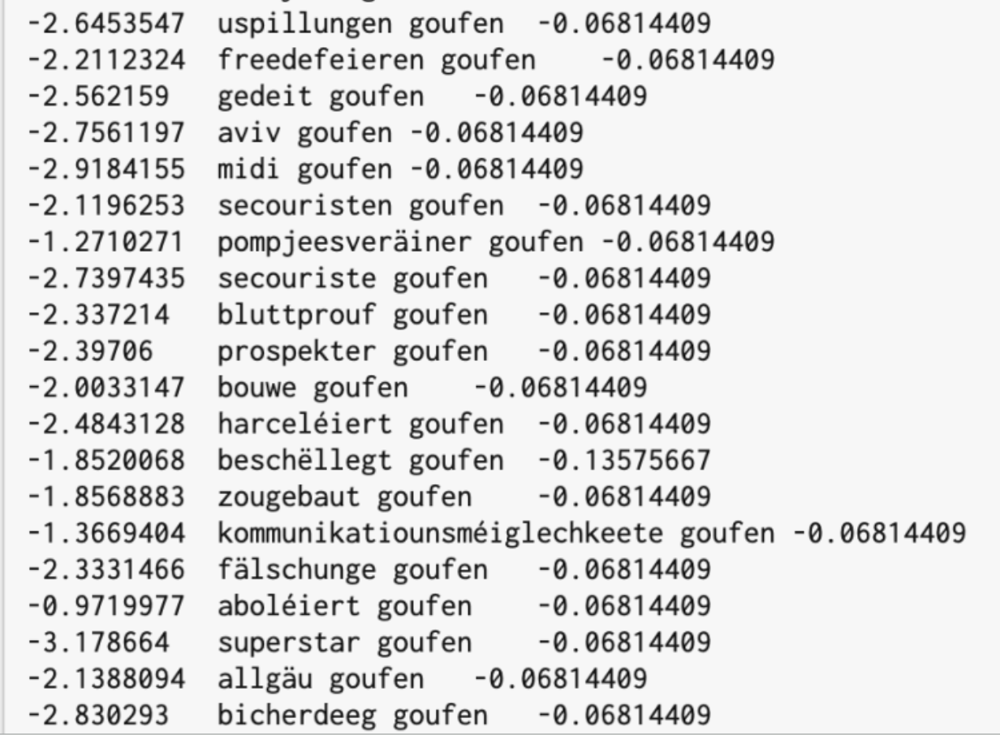{fig-align="left" width=60%}
:::


## OpenAI's Whisper (@radfordRobustSpeechRecognition2022)

- Introduced in September 2022
- Sequence-to-sequence (seq2seq) architecture to learn the contextual representation of speech data
- 680,000 hours of training data from many languages, with transcriptions (e.g. YouTube videos)
- 'weakly-supervised' pretraining
- Pre-training with up to 1.5 billion of parameters
- Luxembourgish included as language
    - with very bad quality, though ;-)
- Building blocks of Whisper
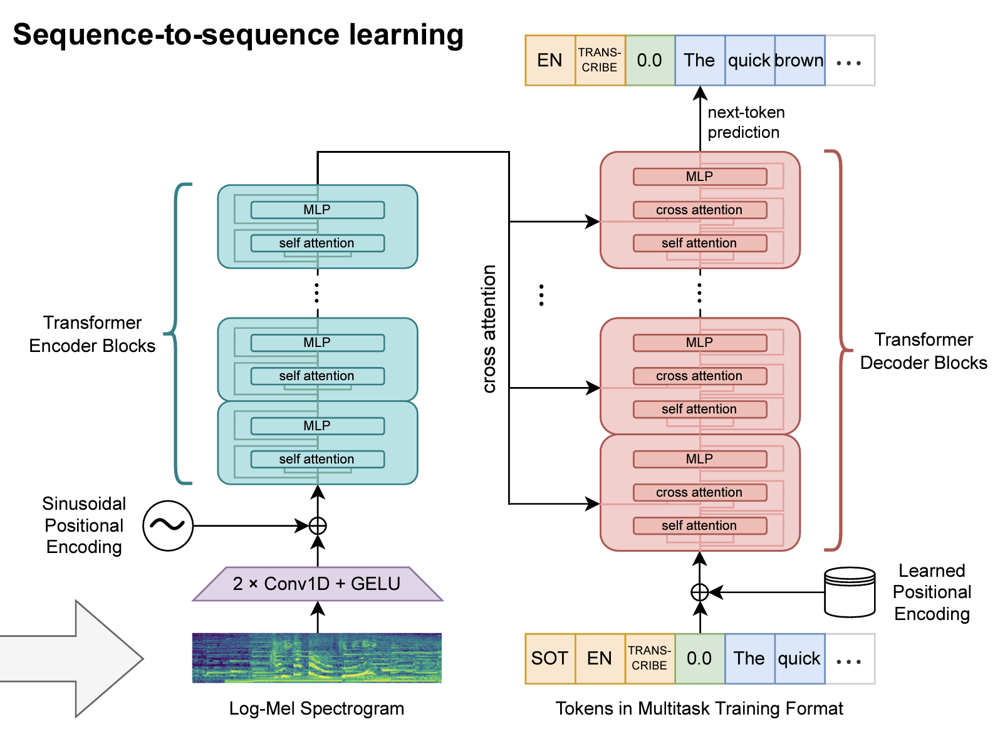
    
- Fine-tuning with our dataset

## Evaluation

<audio controls src="Chamber2022.wav"></audio>

| Ground truth | Wav2vec 2.0 (1B)  | Whisper (large-v2)|
|-----|-----|-----|
| Villmools merci, Här President. Den Avis vun den Experten huet kloer gewisen, datt d'Covid-Kris nach net eriwwer ass, dass de Risk nach ëmmer do ass an datt d'Expektative fir September, zumindest wat d'Experten ugeet, déi sinn, datt mer eventuell virun enger neier Well kënne stoen. Op wellechem Datum, wellech Variant, mat wellecher Virulenz, welleger Ustiechlegkeet, dat wësse mer an dësem Moment selbstverständlech net. Déi Zuelen, déi mer haut kennen, soen dat selwecht. De Staatsminister huet gëschter zitéiert: 1200 Infektiounen den Dag. Dat ass eppes, muss ech soen, wat eis virun enger Rei Joer, virun enger Rei Méint jo weesentlech méi erschreckt huet, wéi et eis haut erschreckt, well d'Situatioun | villmools merci här president den avis vun den experten huet kloer gewisen datt d'covidkris nach net eriwwer ass dass de risk nach ëmmer do ass an datt d'expektative fir september zumindest wat d'experten ugeet déi sinn datt mer eventuell virun enger neier well kënne stoen op wellechem datum **well ech** variant mat wellecher virulenz wellecher **ustieche keet** dat wësse mer an dësem moment selbstverständlech net déi zuelen déi mer haut kennen soen dat selwecht de staatsminister huet gëschter zitéiert den **auszweehonnert** infektiounen den dag dat ass eppes muss ech soen wat eis virun enger rei **t eis** haut erschreckt **war** d'situatioun | Villmools merci, Här President. Den Avis vun den Experten huet kloer gewisen, datt d'Covidkris nach net eriwwer ass, dass de Risk nach ëmmer do ass an datt d'Expektative fir September zumindest wat d'Experten ugeet, déi sinn, datt mer eventuell virun enger neier Well kënne stoen. Op **wellegem** Datum, **welleg** Variant, mat **welleger** Virulenz, welleger Ustiech**tegkeet**, dat wësse mer an dësem Moment selbstverständlech net. Déi Zuelen, déi mer haut kennen, soen dat selwecht. De Staatsminister huet gëschter zitéiert: 1200 Infektiounen den Dag. Dat ass eppes, muss ech soen, wat eis virun enger Rei Joer, virun enger Rei Méint jo weesentlech méi erschreckt huet, wéi et eis haut erschreckt, well d'Situatioun |

## Evaluation

- Word Error Rates (WER)
    - wav2vec 2.0: 10
    - Whisper: 13
- However, superior performance of Whisper over wav2vec 2.0
    - less errors
    - numbers recognised
    - capitalisation and punctuation restored

## Multilingual ASR

<audio controls src="Grand_Duc_2018.wav"></audio>

|Wav2vec 2.0| Whisper|
|-----|-----|
| mir sollen houfreg sinn op d' diversitéit an den zesummenhalt an eiser gesellschaft **a setandroivoudr remercier les non luxembourgeois kee résidu qui travaille en entrep pour leur contribution précieuse an neutre société la cohésion économique mee aus si la sociale den autrepéys sont des atouts kinsapartier de défense dat oury i sont d' acer den entree tenure reussite senatus** haut op dësem chrescht owent wëll ech meng unerkennung awer net nëmmen op de politesche plang begrenzen|Mir sollen houfreg sinn op d'Diversitéit an den Zesummenhalt an eise Gesellschaft. **A cet endroit, je voudrais remercier les non luxembourgeois qui resident ou qui travaillent à notre pays pour leur contribution précieuse à notre société.  cohésion économique, mais aussi la cohésion sociale de notre pays sont des atouts qui nous appartiennent de défendre à tout prix. Ils sont au coeur de notre projet et de notre réussite. C' est notre bien commun à tous.**  Haut, op dësem chrëschtel Wënd, wëll ech meng Unerkennung awer net nëmmen op de politesche Plang begrenzen.|

## Demos

- Available online at Hugging Face: (https://huggingface.co/unilux)

## References

::: {#refs}
:::